In [1]:
%load_ext autoreload
%autoreload 2
import warnings
warnings.filterwarnings('ignore', category=DeprecationWarning)

In [2]:
# !pip install --user kaggle

#### Kaggle Credit Card Fraud Detection

* Leverages Tensorflow
* Make sure kaggle.json containing API Token is in **'C:\Users\<USER_ID>\.kaggle\'** file path

In [ ]:
%load_ext autoreload
%autoreload 2
import warnings
warnings.filterwarnings('ignore',category=DeprecationWarning)

In [1]:
from kaggle.api.kaggle_api_extended import KaggleApi

api = KaggleApi()
api.authenticate()
reference = api.datasets_list(search='Credit Card Fraud Detection')[0]['ref']
api.dataset_download_files(reference)

In [2]:
from zipfile import ZipFile

zf = ZipFile('creditcardfraud.zip')
zf.extractall()
zf.close()

In [3]:
import pandas as pd
import numpy as np
import datatable as dt

csv_name = 'creditcard.csv'
# dt implementation is approx 1/10 time of pd.read_csv()
creditcard_df = dt.fread(csv_name).to_pandas()

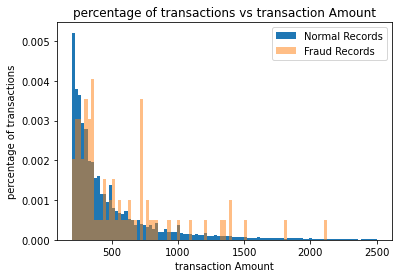

In [5]:
import matplotlib.pyplot as plt
# 0 = normal, 1 = fraud
pd.value_counts(creditcard_df['Class'], sort=True)
normal_records, fraud_records = creditcard_df[creditcard_df['Class']==0], creditcard_df[creditcard_df['Class']==1]
bins = np.linspace(200,2500,100)
plot_feature = 'Amount'
plt.hist(normal_records[plot_feature],bins=bins,alpha=1,density=True,label='Normal Records')
plt.hist(fraud_records[plot_feature],bins=bins,alpha=0.5,density=True,label='Fraud Records')
plt.legend(loc='upper right')
x_lab, y_lab = f'transaction {plot_feature}', f'percentage of transactions'
plt.xlabel(x_lab)
plt.ylabel(y_lab)
plt.title(f'{y_lab} vs {x_lab}')
plt.show()

In [14]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from icecream import ic

std_scale = StandardScaler()
scale_cols = ['Time','Amount']
creditcard_df_scaled = creditcard_df.copy()
for col in scale_cols:
    creditcard_df_scaled[f'{col}'] = std_scale.fit_transform(creditcard_df_scaled[col].values.reshape(-1,1))
labels, features = creditcard_df_scaled.values[:,-1], creditcard_df_scaled.values[:,0:-1]
random_state = 2021
data_train, data_test = train_test_split(creditcard_df, test_size=0.2, random_state=random_state)
X_train = data_train[data_train['Class'] == 0].copy()
X_train = X_train.drop(['Class'],axis=1)
y_test = data_test['Class'].copy()
X_test = data_test.copy().drop(['Class'],axis=1)
X_train, X_test = X_train.values, X_test.values
ic(X_train.shape);
ic(X_test.shape);
mm_scale = MinMaxScaler()
X_train_scaled, X_test_scaled = mm_scale.fit_transform(X_train), mm_scale.fit_transform(X_test)


ic| X_train.shape: (227456, 30)
ic| X_test.shape: (56962, 30)


In [17]:
import tensorflow as tf
import keras
from keras.models import Model, load_model
from keras.layers import Input, Dense
from keras.callbacks import ModelCheckpoint, TensorBoard
from keras import regularizers

input_dim, encoding_dim = X_train.shape[1], 6
input_layer = Input(shape=(input_dim,))
encoder = Dense(encoding_dim,activation="tanh",activity_regularizer=regularizers.l1(1e-4))(input_layer)
encoder = Dense(int(encoding_dim/2),activation="tanh")(encoder)
encoder = Dense(int(encoding_dim/4),activation="tanh")(encoder)
decoder = Dense(int(encoding_dim/2),activation="tanh")(encoder)
decoder = Dense(int(encoding_dim),activation="tanh")(decoder)
decoder = Dense(input_dim,activation="tanh")(decoder)
autoencoder = Model(inputs=input_layer,outputs=decoder)
autoencoder.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 30)]              0         
_________________________________________________________________
dense (Dense)                (None, 6)                 186       
_________________________________________________________________
dense_1 (Dense)              (None, 3)                 21        
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 4         
_________________________________________________________________
dense_3 (Dense)              (None, 3)                 6         
_________________________________________________________________
dense_4 (Dense)              (None, 6)                 24        
_________________________________________________________________
dense_5 (Dense)              (None, 30)                210   

In [18]:
nb_epoch, batch_size = 100, 50
autoencoder.compile(optimizer="adam",loss="mse")
history = autoencoder.fit(
    x=X_train_scaled,
    y=X_train_scaled,
    epochs=nb_epoch,
    batch_size=batch_size,
    shuffle=True,
    validation_split=0.1,
    verbose=0
).history

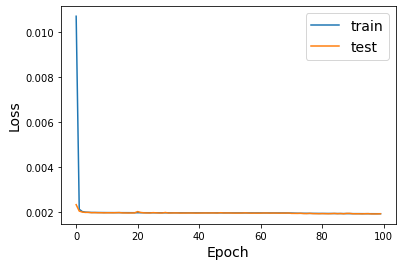

In [55]:
plt.figure(figsize=(6,4))
plt.plot(history['loss'])
plt.plot(history['val_loss'])
x_lab, y_lab, fontsize = 'Epoch', 'Loss', 14
plt.xlabel(x_lab,fontsize=fontsize)
plt.ylabel(y_lab,fontsize=fontsize)
plt.legend(['train','test'],loc='upper right',fontsize=fontsize);

#### Anomalies are where the reconstruction loss is high

In [29]:
preds = autoencoder.predict(X_test_scaled)
mse = np.mean(np.power(X_test_scaled - preds, 2),axis=1)
reconstruction_loss_field, label_field = 'reconstruction_error', 'Label'
error_df = pd.DataFrame({reconstruction_loss_field:mse,label_field:y_test},index=y_test.index)
error_df.describe()

,reconstruction_error
count,56962.000000
mean,0.030834
std,0.004558
min,0.021264
25%,0.028447
50%,0.030060
75%,0.031910
max,0.222673


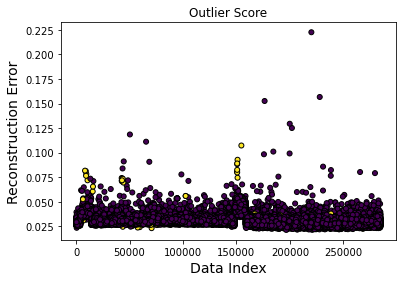

In [56]:
plt.figure(figsize=(6,4))
plt.scatter(error_df.index,error_df[reconstruction_loss_field],c=error_df[label_field],edgecolor='black',s=25)
x_lab_re, y_lab_re, title_re = 'Data Index', 'Reconstruction Error', 'Outlier Score'
plt.xlabel(x_lab_re,fontsize=fontsize)
plt.ylabel(y_lab_re,fontsize=fontsize)
plt.title(title_re);

ic| accuracy_score(error_df[label_field],error_df['pred_y']): 0.9980688880306169
ic| recall_score(error_df[label_field],error_df['pred_y']): 0.17475728155339806
ic| precision_score(error_df[label_field],error_df['pred_y']): 0.4186046511627907


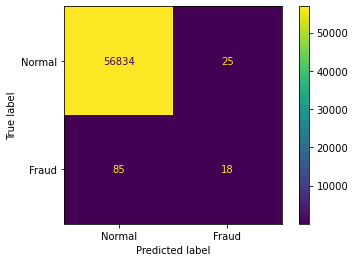

In [54]:
from sklearn.metrics import (
    confusion_matrix, 
    ConfusionMatrixDisplay, 
    accuracy_score, 
    recall_score,
    precision_score
)

threshold = 0.07
pred_y = [1 if re_val > threshold else 0 for re_val in error_df[reconstruction_loss_field].values]
error_df['pred_y'] = pred_y
cm = confusion_matrix(error_df[label_field], pred_y)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=['Normal','Fraud'])
disp.plot();
# summary metrics
ic(accuracy_score(error_df[label_field],error_df['pred_y']));
ic(recall_score(error_df[label_field],error_df['pred_y']));
ic(precision_score(error_df[label_field],error_df['pred_y']));

#### Autoencoders

* Autoencoders can reduce dim in high-dim dataset
* Autoencoders good for outlier detector in complex dataset